In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
from fastai2.vision.all import show_image, show_images
import matplotlib.pyplot as plt
import numpy as np
import os
import pandas as pd
from pathlib import Path
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import DataLoader

from htools import *
from img_wang.data import get_databunch
from img_wang.models import SingleInputBinaryModel, TorchvisionEncoder,\
    load_encoder
from img_wang.torch_utils import gpu_setup, PredictionExaminer
from incendio.core import Trainer

/opt/conda/envs/fastai/lib/python3.7/site-packages/incendio/callbacks.py:25: UserWarning: Accio not available.
  warnings.warn('Accio not available.')


In [3]:
cd_root()
gpu_setup()

Current directory: /storage/img-wang
Setting seeds for reproducible training.


In [6]:
dst, dsv, dlt, dlv = get_databunch('data/imagewang-160/', 
                                   mode='supervised',
                                   bs=256)

In [7]:
net = SingleInputBinaryModel(
    TorchvisionEncoder('mobilenet_v2', pretrained=False),
    n_out=len(dst.class_to_idx)
)

In [8]:
T = Trainer(net, dst, dsv, dlt, dlv, F.cross_entropy, 'multiclass', 
            'data/supervised_models/v10', last_act=nn.Softmax(-1))

## v5

Pretrained MobileNet (no SSL).

Note: realized that with standard get_databunch function, dst will still apply transforms. Not a huge deal for now but something to keep in mind. Could try to add new functionality but don't want to break anything so only do it if it's really necessary.

In [9]:
!cat data/supervised_models/v5/cmd.txt

python bin/s01-train-unsup-single-input.py \
	--bs 32 \
	--enc_kwargs {arch: mobilenet_v2, pretrained: True} \
	--lrs 1e-3 \
	--patience 25 \
	--ds_mode supervised



In [10]:
T.load(old_path='data/supervised_models/v5/trainer.pkl')

2020-10-15 05:47:24,540 [INFO]: Loading weights from data/supervised_models/v5/trainer.pkl.


In [11]:
px = PredictionExaminer(T)
dft5 = px.evaluate('train')
dft5.ends()

,y,y_pred,y_proba,correct,mistake
1598,16,13,0.998582,False,0.998582
14349,17,13,0.997674,False,0.997674
8407,14,16,0.996404,False,0.996404
1211,0,0,1.000000,True,-1.000000
10450,0,0,1.000000,True,-1.000000
7689,0,0,1.000000,True,-1.000000


In [12]:
px.class_to_top_mistakes('train')

{16: {13: 16, 17: 9, 12: 6},
 17: {12: 25, 13: 23, 16: 14},
 14: {16: 17, 19: 13, 13: 13},
 7: {5: 18, 11: 13, 3: 8},
 9: {1: 38, 10: 14, 8: 14},
 2: {5: 10, 11: 8, 3: 6},
 1: {8: 7, 6: 5, 3: 4},
 11: {8: 11, 10: 2, 6: 2},
 6: {5: 11, 13: 1, 11: 1},
 12: {16: 13, 17: 5, 13: 5},
 13: {8: 24, 16: 13, 15: 12},
 0: {13: 4, 10: 4, 8: 3},
 3: {8: 8, 1: 7, 5: 3},
 18: {0: 5, 15: 3, 13: 3},
 4: {3: 33, 8: 6, 11: 2},
 8: {1: 21, 3: 10, 13: 5},
 15: {12: 9, 8: 7, 17: 6},
 10: {8: 3, 15: 1, 14: 1},
 19: {13: 11, 15: 6, 18: 4},
 5: {6: 7, 1: 3, 13: 2}}

In [13]:
px.confusion_matrix('train')

y_pred,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19
y,,,,,,,,,,,,,,,,,,,,
0,1325,1,1,1,0,0,1,1,3,0,4,2,1,4,1,1,1,0,1,2
1,0,122,0,4,0,3,5,0,7,1,0,0,0,0,0,0,0,0,0,0
2,0,0,90,6,1,10,1,1,1,0,0,8,0,1,0,0,0,0,0,0
3,1,7,1,116,0,3,1,0,8,0,0,2,1,0,0,1,0,0,0,0
4,0,0,0,33,31,0,0,0,6,0,0,2,0,1,0,0,1,0,0,1
5,0,3,0,2,0,130,7,0,1,0,0,0,0,2,0,1,0,0,0,0
6,0,0,0,0,0,11,133,1,0,0,0,1,0,1,0,0,0,0,0,0
7,0,8,0,8,0,18,6,70,1,0,2,13,0,0,0,0,0,0,1,0
8,0,21,0,10,1,4,1,0,1301,1,1,1,0,5,0,0,1,0,2,1


In [14]:
px.label_vcounts('train').head()

,y_pred,y_pred_raw_count,y_pred_normed_count
0,8,1401,0.095508
1,16,1375,0.093735
2,12,1373,0.093599
3,15,1351,0.092099
4,18,1351,0.092099


In [15]:
px.pred_vcounts('train')

,y,y_raw_count,y_normed_count
0,15,1350,0.092031
1,19,1350,0.092031
2,8,1350,0.092031
3,16,1350,0.092031
4,17,1350,0.092031
5,18,1350,0.092031
6,0,1350,0.092031
7,12,1350,0.092031
8,14,1350,0.092031
9,13,1244,0.084805


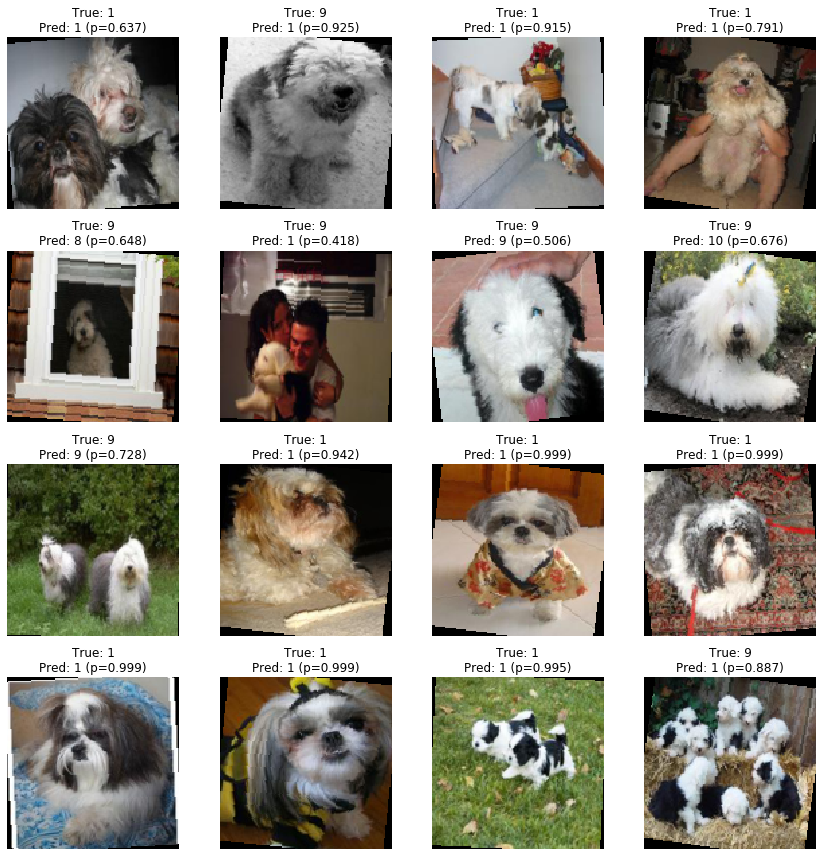

In [18]:
px.random('train', true_classes=[1, 9])

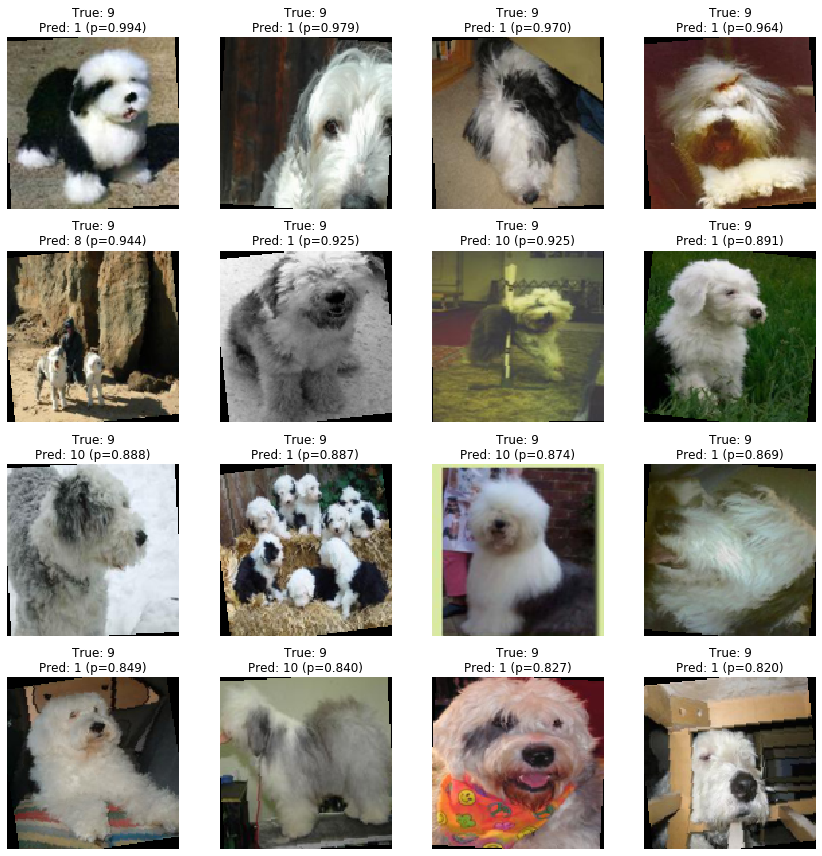

In [17]:
px.most_wrong('train', true_classes=[9])

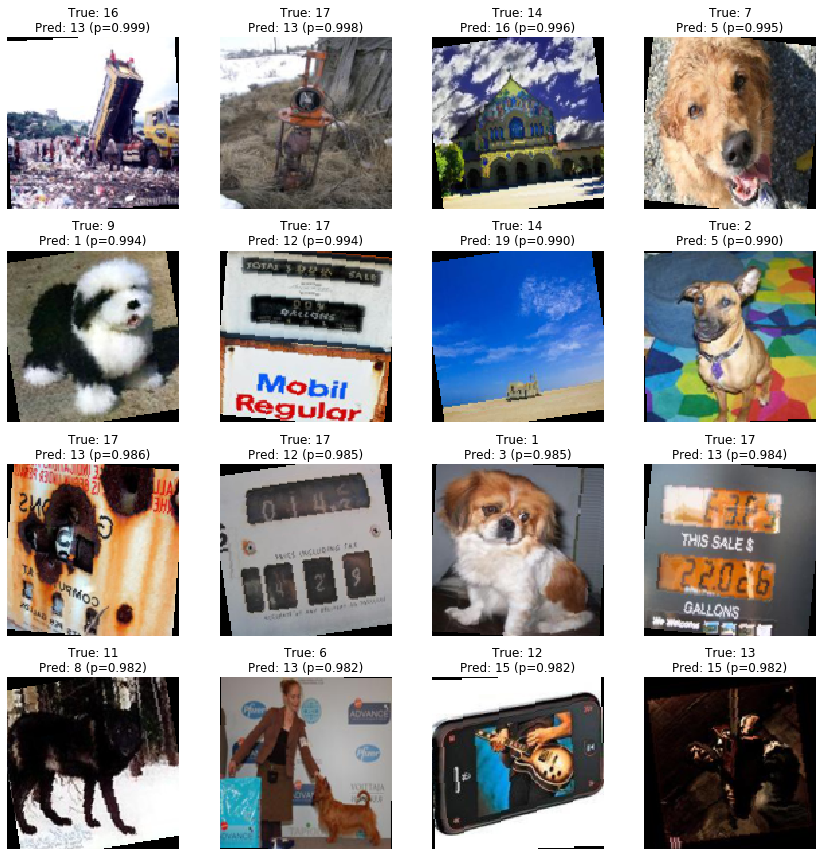

In [19]:
px.most_wrong('train')

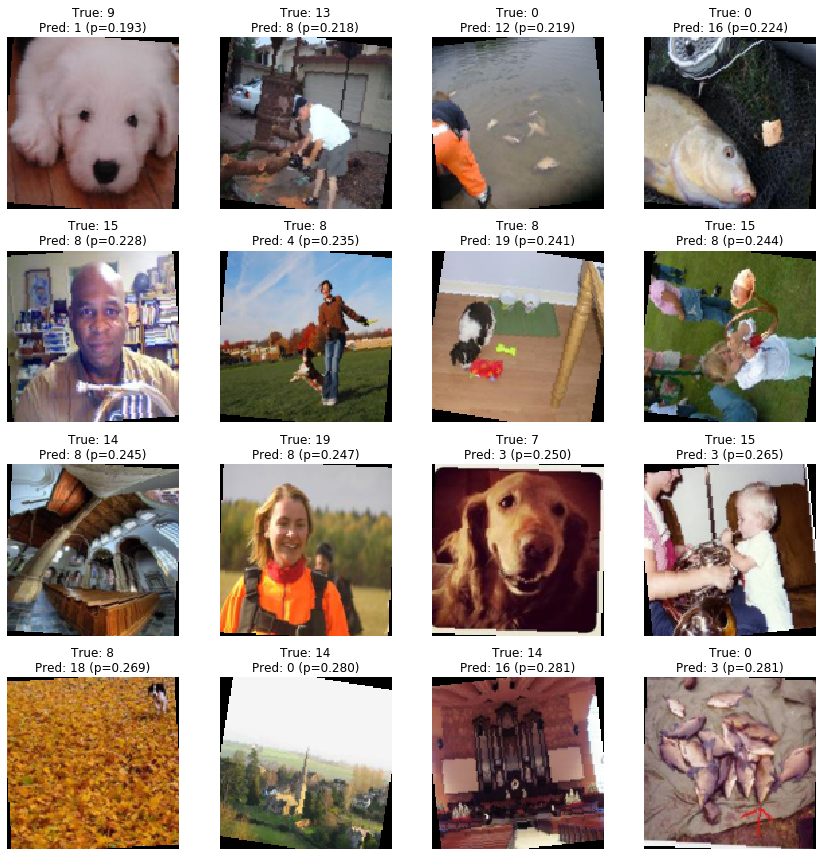

In [20]:
px.least_wrong('train')

In [21]:
dfv5 = px.evaluate('val')
dfv5.ends()

,y,y_pred,y_proba,correct,mistake
134,4,8,0.999489,False,0.999489
1485,10,8,0.999409,False,0.999409
2415,11,8,0.999400,False,0.999400
2335,6,6,0.999980,True,-0.999980
1693,6,6,0.999981,True,-0.999981
2500,6,6,0.999993,True,-0.999993


In [23]:
px.class_to_top_mistakes('val')

{4: {3: 109, 8: 30, 11: 12},
 10: {8: 42, 1: 18, 11: 12},
 11: {8: 27, 2: 19, 3: 18},
 1: {8: 53, 6: 32, 5: 23},
 3: {8: 54, 11: 17, 1: 15},
 5: {6: 28, 1: 22, 8: 20},
 6: {5: 35, 8: 21, 1: 21},
 9: {1: 142, 10: 72, 8: 62},
 2: {11: 48, 5: 47, 3: 28},
 7: {11: 51, 5: 44, 1: 41}}

In [25]:
px.confusion_matrix('val')

y_pred,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19
y,,,,,,,,,,,,,,,,,,,,
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,1,266,0,10,1,23,32,1,53,8,6,1,0,0,0,3,1,0,3,0
2,4,1,217,28,4,47,10,16,11,0,0,48,1,9,1,4,2,0,3,2
3,2,15,4,278,6,12,6,1,54,0,0,17,2,6,0,5,4,2,2,2
4,0,4,6,109,43,6,0,3,30,0,0,12,0,6,0,2,0,2,1,0
5,1,22,8,6,0,288,28,2,20,0,0,13,0,4,3,1,1,3,1,0
6,1,21,0,2,0,35,307,2,21,0,1,13,1,1,0,1,0,0,0,1
7,1,41,16,28,3,44,29,151,14,2,9,51,0,2,0,4,2,0,3,1
8,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


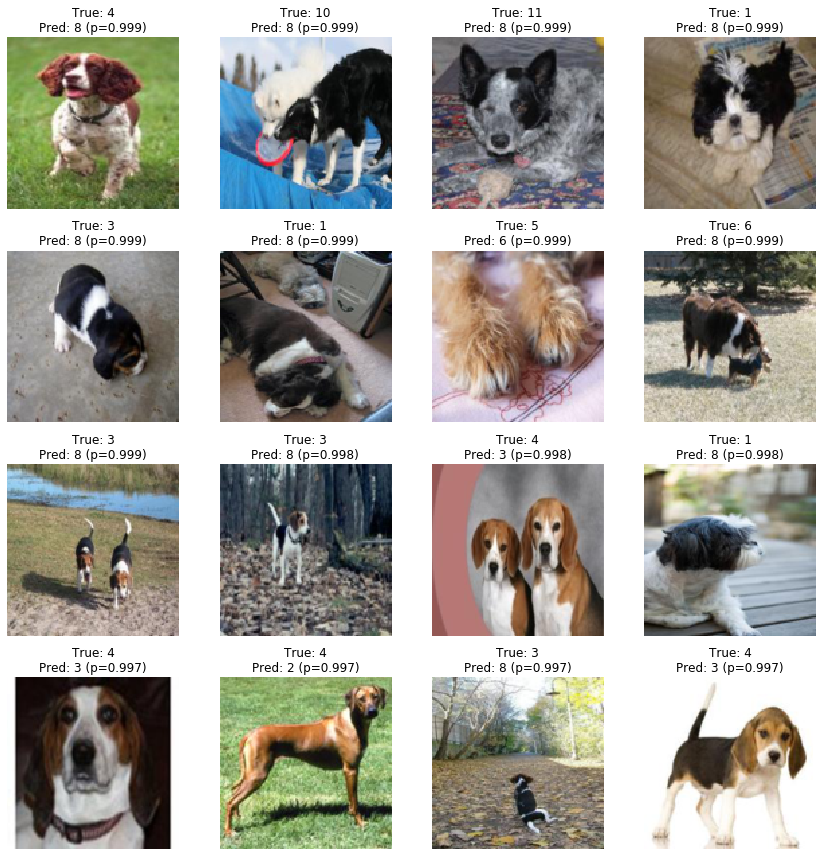

In [26]:
px.most_wrong('val')

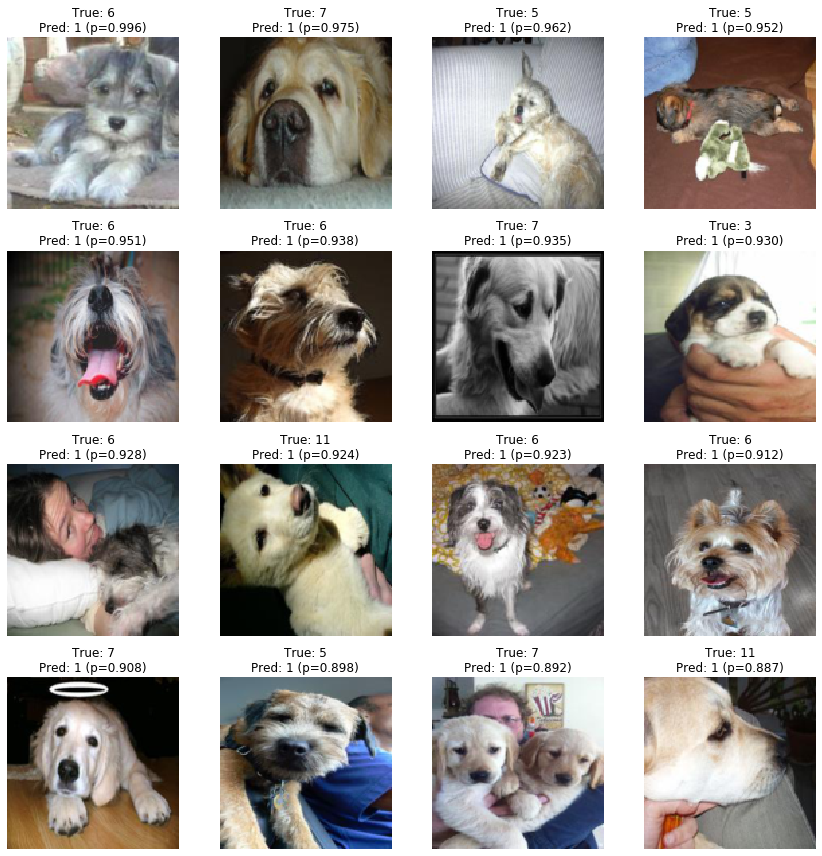

In [29]:
px.most_wrong('val', pred_classes=[1], true_classes=np.r_[0:9, 10:19])

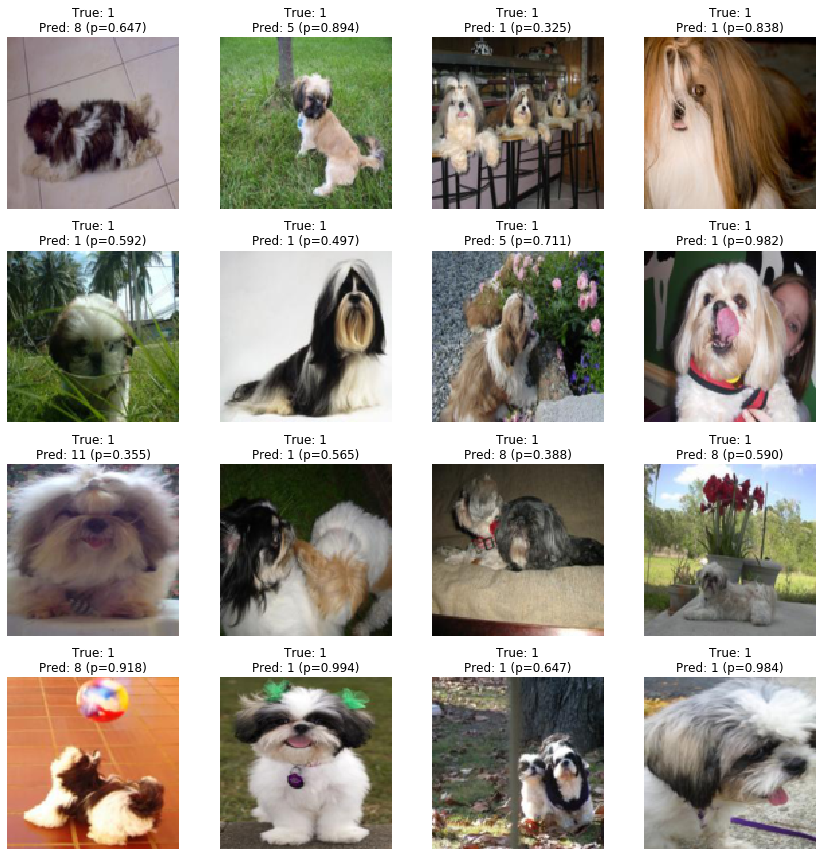

In [31]:
px.random('val', true_classes=[1])

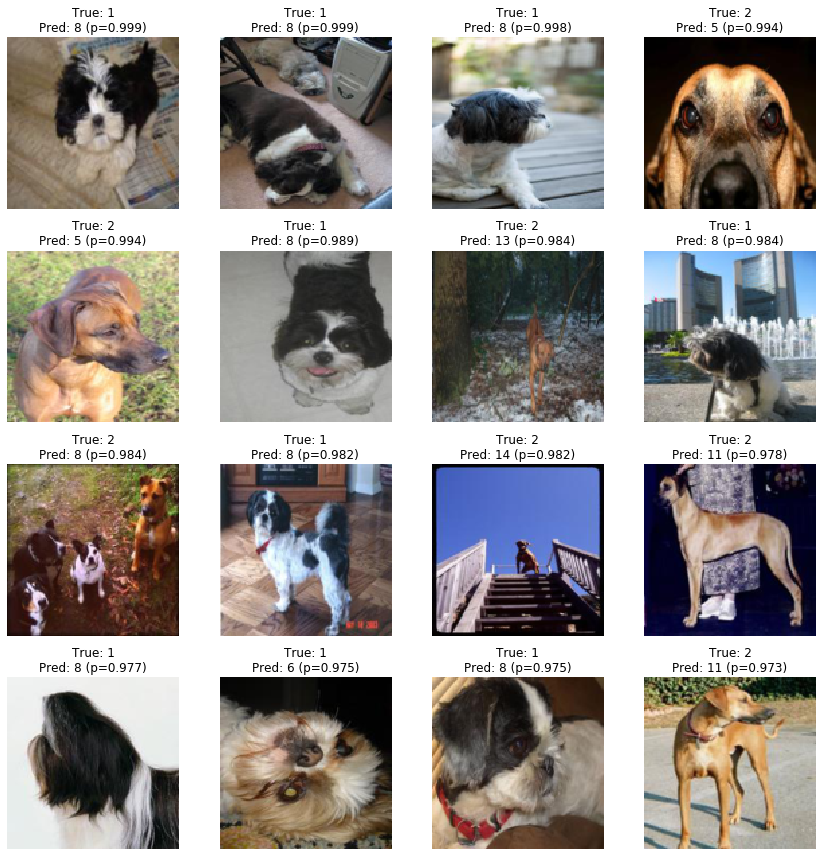

In [32]:
px.most_wrong(true_classes=[1, 2])

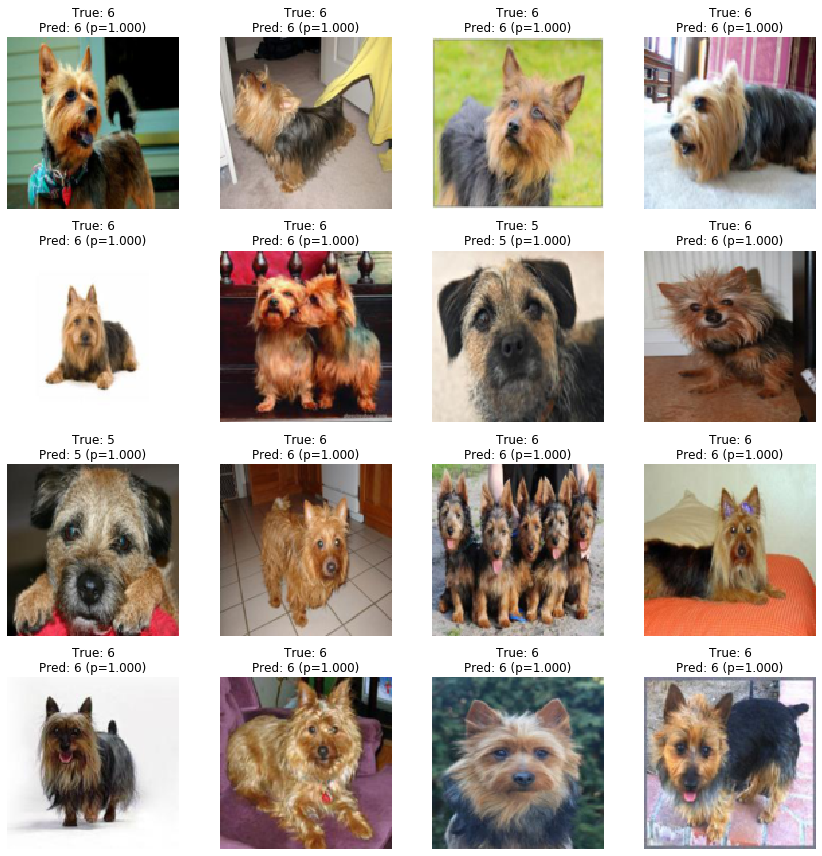

In [33]:
px.most_correct('val')

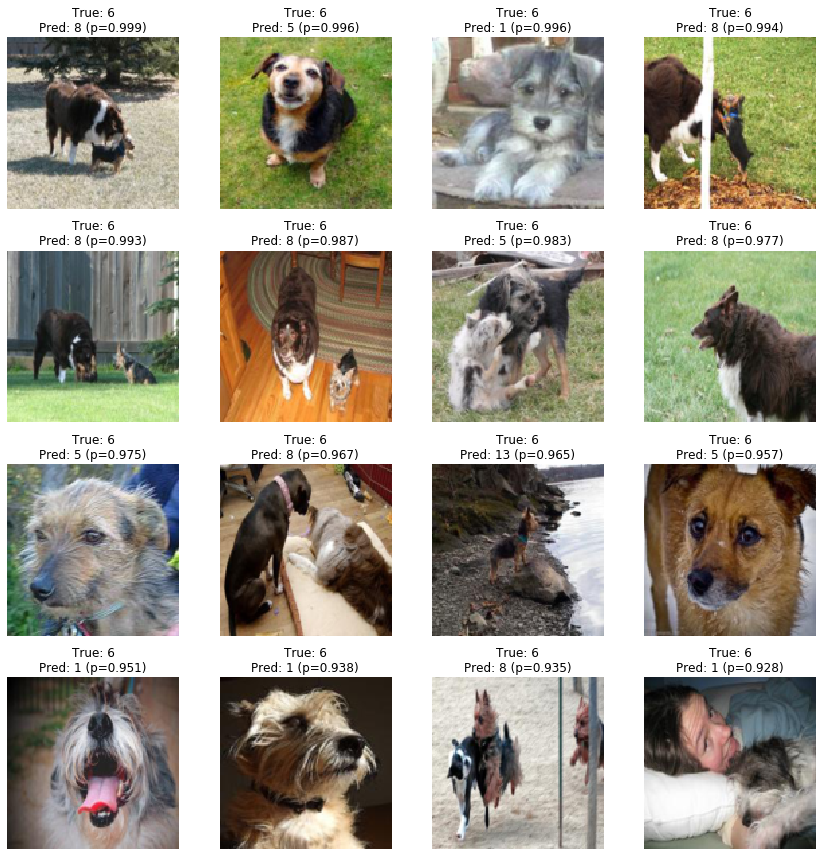

In [34]:
px.most_wrong('val', true_classes=[6])

## v12

Transferred from SSL v9 (elastic transform).

In [35]:
T.load(old_path='data/supervised_models/v12/trainer.pkl')

2020-10-15 05:57:46,346 [INFO]: Loading weights from data/supervised_models/v12/trainer.pkl.


In [36]:
px = PredictionExaminer(T)
px.evaluate('train')

,y,y_pred,y_proba,correct,mistake
12343,13,11,0.997513,False,0.997513
4331,16,13,0.996655,False,0.996655
11243,8,3,0.996055,False,0.996055
3594,13,19,0.994383,False,0.994383
5977,18,19,0.993491,False,0.993491
...,...,...,...,...,...
10033,18,18,1.000000,True,-1.000000
2213,14,14,1.000000,True,-1.000000
12832,15,15,1.000000,True,-1.000000
2212,19,19,1.000000,True,-1.000000


In [37]:
px.confusion_matrix('train')

y_pred,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19
y,,,,,,,,,,,,,,,,,,,,
0,1344,1,0,0,0,0,1,1,0,0,0,1,0,1,0,1,0,0,0,0
1,0,139,0,0,0,0,0,1,1,1,0,0,0,0,0,0,0,0,0,0
2,0,0,118,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0
3,0,0,1,137,1,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0
4,0,0,0,1,72,0,0,0,0,0,0,0,0,2,0,0,0,0,0,0
5,0,0,0,2,0,139,3,1,0,0,0,0,0,1,0,0,0,0,0,0
6,0,0,0,0,0,0,146,0,0,0,0,0,0,0,0,0,0,0,1,0
7,0,0,0,0,0,0,0,127,0,0,0,0,0,0,0,0,0,0,0,0
8,0,1,1,8,4,4,2,0,1320,1,0,2,0,2,1,1,0,0,1,2


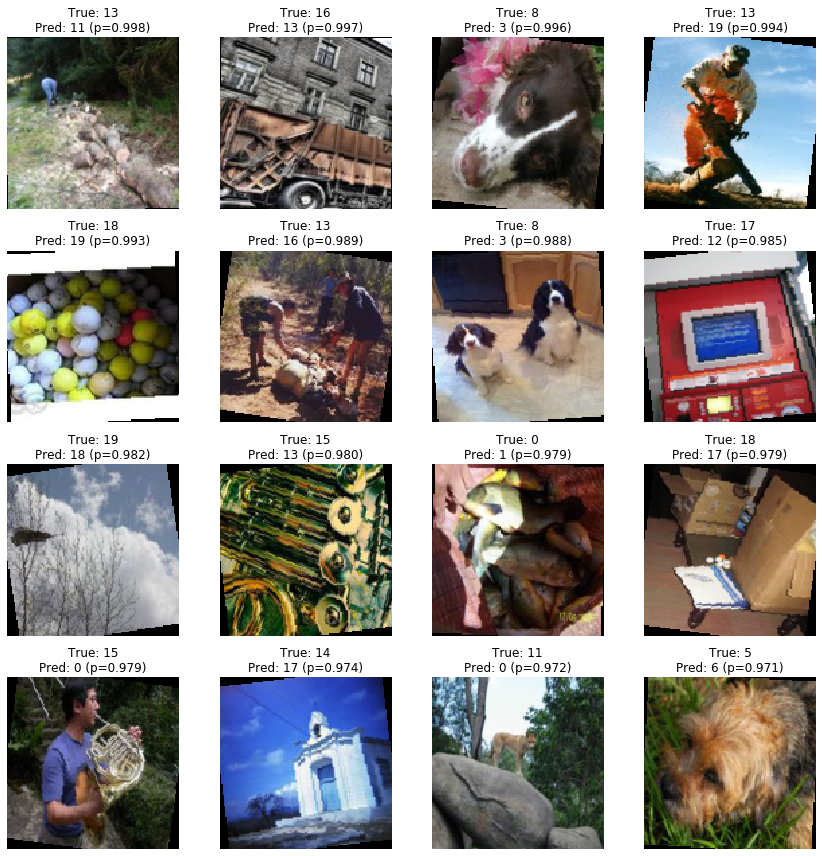

In [39]:
px.most_wrong('train')

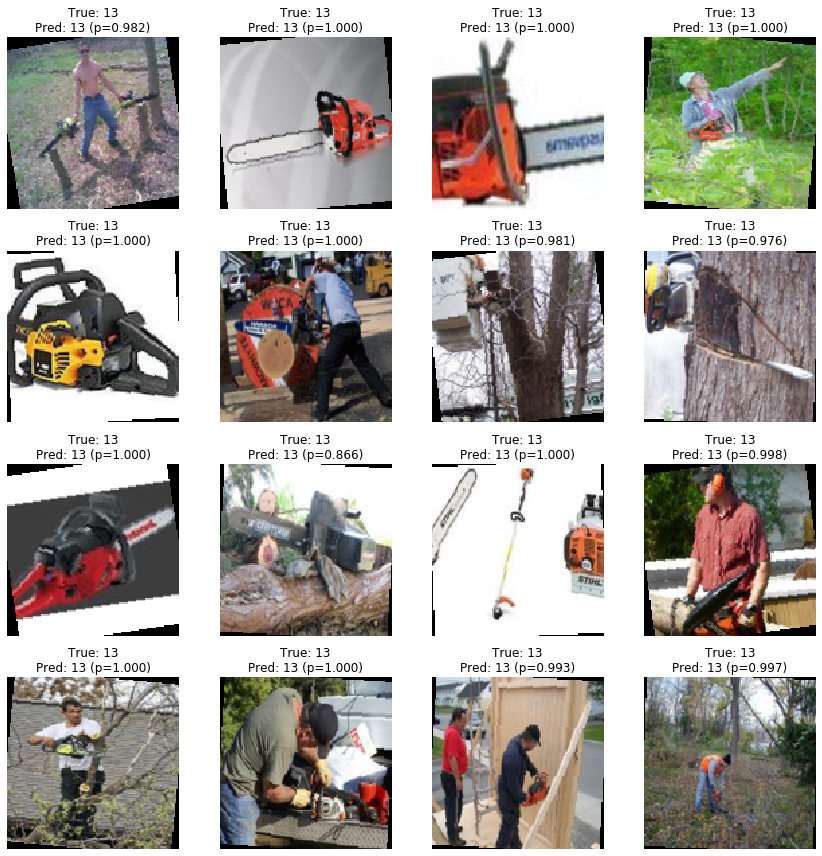

In [40]:
px.random('train', true_classes=[13])

In [41]:
px.evaluate('val')

,y,y_pred,y_proba,correct,mistake
2241,1,0,1.0,False,1.0
928,1,8,1.0,False,1.0
294,9,8,1.0,False,1.0
2805,2,18,1.0,False,1.0
2070,4,8,1.0,False,1.0
...,...,...,...,...,...
2129,5,5,1.0,True,-1.0
3800,5,5,1.0,True,-1.0
1435,10,10,1.0,True,-1.0
2335,6,6,1.0,True,-1.0


In [42]:
px.confusion_matrix('val')

y_pred,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19
y,,,,,,,,,,,,,,,,,,,,
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,10,62,4,24,25,15,27,26,111,32,9,8,3,10,5,11,0,1,20,6
2,24,5,95,10,9,15,34,49,24,3,4,38,0,31,13,15,4,10,9,16
3,15,22,24,70,19,21,20,28,106,10,3,5,6,23,10,16,7,4,3,6
4,7,3,13,25,46,7,7,9,52,4,1,8,2,14,3,15,0,2,2,4
5,34,10,17,14,11,79,45,29,48,11,0,29,6,25,6,14,3,4,11,5
6,14,10,18,10,10,27,147,36,48,12,1,19,1,20,10,10,1,1,4,8
7,21,10,37,16,12,18,35,132,20,21,10,31,0,11,7,6,1,0,7,6
8,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


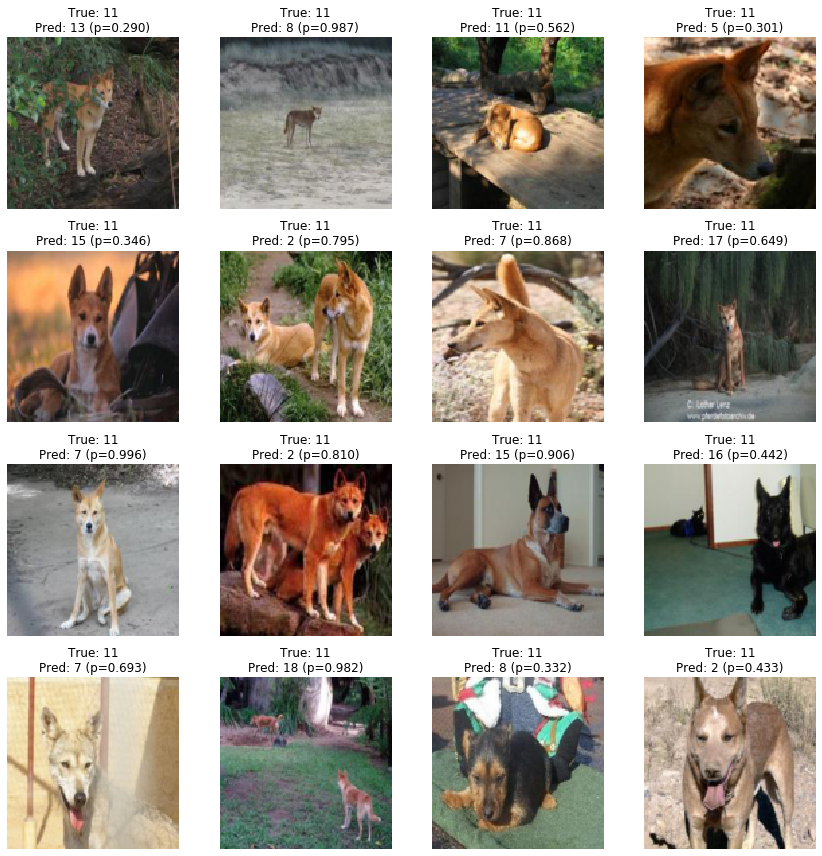

In [44]:
px.random('val', true_classes=[11])

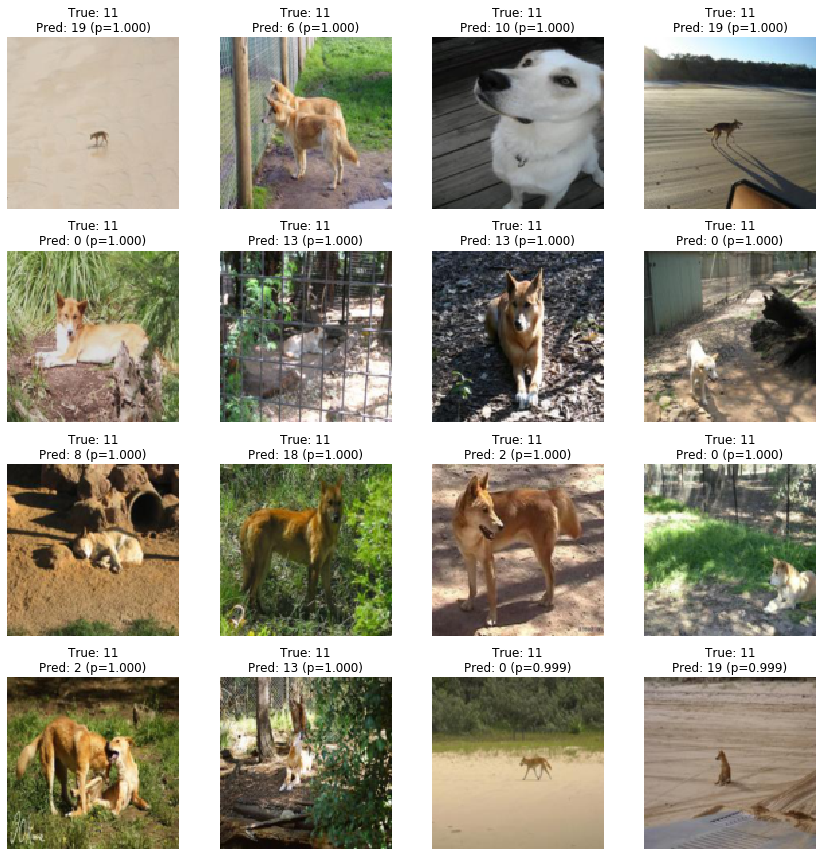

In [43]:
px.most_wrong('val', true_classes=[11])

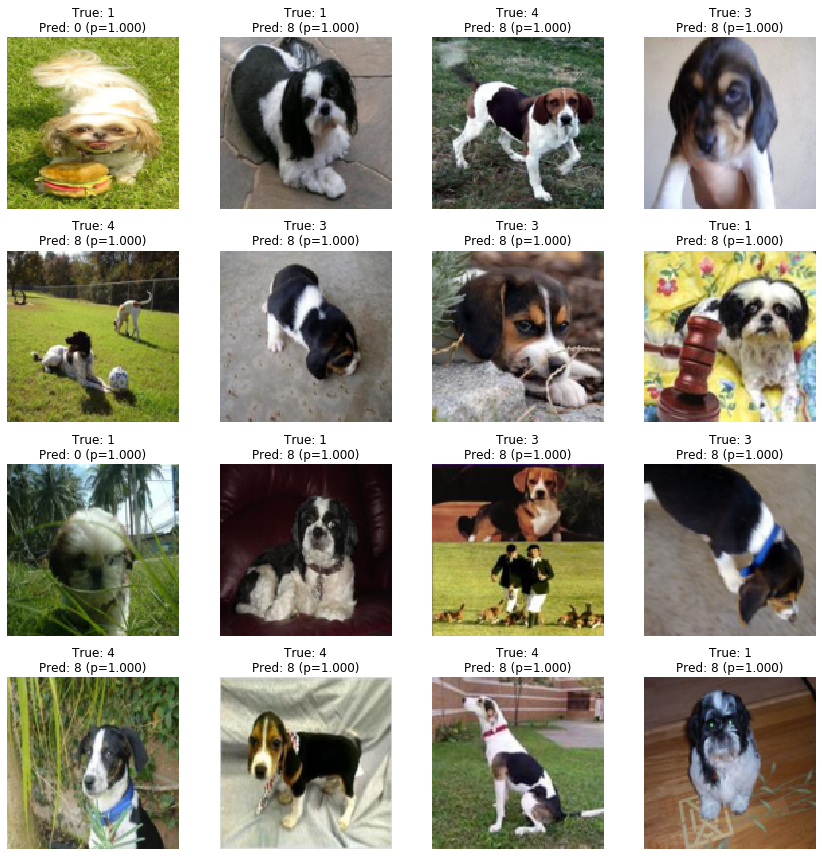

In [46]:
px.most_wrong('val', true_classes=[1, 3, 4])

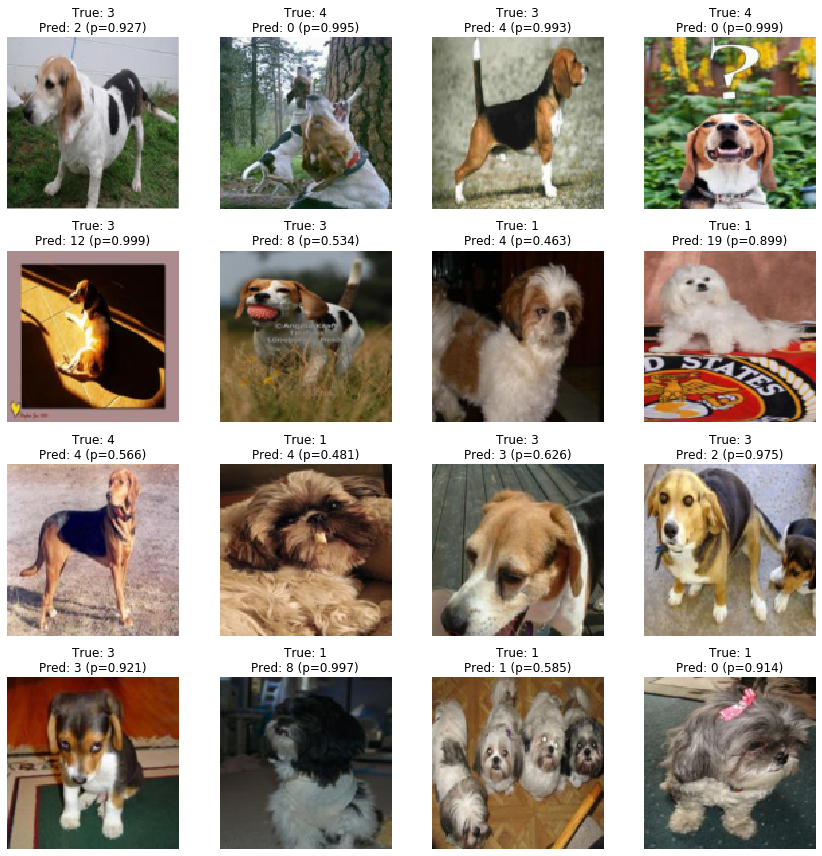

In [47]:
px.random('val', true_classes=[1, 3, 4, 8])